# Notebook for training models and storing results

In [1]:
import unittest
import os
import pathlib
import urllib
import shutil
import re
import zipfile
import torch
import numpy as np
import torch
import IPython.display
import matplotlib.pyplot as plt
import torchvision.transforms as T
from torchvision.datasets import ImageFolder


import torch.optim as optim
from torch.utils.data import DataLoader
import tqdm
import sys

sys.path.append("..") # Adds higher directory to python modules path.

import cs3600.download
import cs3600.plot as plot
from hw4.answers import PART3_CUSTOM_DATA_URL as CUSTOM_DATA_URL
from hw4 import gan
from hw4 import answers
from hw4.gan import train_batch, save_checkpoint
from hw4.answers import part3_gan_hyperparams
from hw4.answers import PART3_CUSTOM_DATA_URL as CUSTOM_DATA_URL
from hw4.scores import samples_to_fid
#from hw4.wgan import train_wgan_batch
#from hw4.answers import part4_wgan_hyperparams
from hw4.wgan import train_wgan_batch, critic_loss_function, generator_loss_function
#from hyperparams import sn_gan_hyperparams, wgan_hyperparams
import hyperparams


C:\Users\nitsa\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torchvision\io\image.py:11: UserWarning: Failed to load image Python extension: Could not find module 'C:\Users\nitsa\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torchvision\image.pyd' (or one of its dependencies). Try using the full path with constructor syntax.
  warn(f"Failed to load image Python extension: {e}")


Utilaty function for storing fid score at training time.
Calculates the fid score once per epoch on the first batch 

In [2]:
def save_fid_score(fid_scores,batch_number,gen,x_data):
    if batch_number == 0:
        num_samples = x_data.shape[0]
        fid_score = samples_to_fid(x_data,gen.sample(num_samples,with_grad=False))
        fid_scores.append(fid_score)


# Vanilla GAN


Load hyper params

In [3]:
import cs3600.plot as plot
import cs3600.download
from hw4.answers import PART3_CUSTOM_DATA_URL as CUSTOM_DATA_URL

DATA_DIR = pathlib.Path.home().joinpath('.pytorch-datasets')
if CUSTOM_DATA_URL is None:
    DATA_URL = 'http://vis-www.cs.umass.edu/lfw/lfw-bush.zip'
else:
    DATA_URL = CUSTOM_DATA_URL

_, dataset_dir = cs3600.download.download_data(out_path=DATA_DIR, url=DATA_URL, extract=True, force=False)

File C:\Users\nitsa\.pytorch-datasets\lfw-bush.zip exists, skipping download.
Extracting C:\Users\nitsa\.pytorch-datasets\lfw-bush.zip...
Extracted 531 to C:\Users\nitsa\.pytorch-datasets\lfw/George_W_Bush


In [4]:
import torchvision.transforms as T
from torchvision.datasets import ImageFolder

im_size = 64
tf = T.Compose([
    # Resize to constant spatial dimensions
    T.Resize((im_size, im_size)),
    # PIL.Image -> torch.Tensor
    T.ToTensor(),
    # Dynamic range [0,1] -> [-1, 1]
    T.Normalize(mean=(.5,.5,.5), std=(.5,.5,.5)),
])

ds_gwb = ImageFolder(os.path.dirname(dataset_dir), tf)

In [5]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


In [20]:
torch.manual_seed(42)

# Hyperparams
hp = part3_gan_hyperparams()
batch_size = hp['batch_size']
z_dim = hp['z_dim']

# Data
dl_train = DataLoader(ds_gwb, batch_size, shuffle=True)
im_size = ds_gwb[0][0].shape

# Model
dsc = gan.Discriminator(im_size).to(device)
gen = gan.Generator(z_dim, featuremap_size=4).to(device)

# Optimizer
def create_optimizer(model_params, opt_params):
    opt_params = opt_params.copy()
    optimizer_type = opt_params['type']
    opt_params.pop('type')
    return optim.__dict__[optimizer_type](model_params, **opt_params)
dsc_optimizer = create_optimizer(dsc.parameters(), hp['discriminator_optimizer'])
gen_optimizer = create_optimizer(gen.parameters(), hp['generator_optimizer'])

# Loss
def dsc_loss_fn(y_data, y_generated):
    return gan.discriminator_loss_fn(y_data, y_generated, hp['data_label'], hp['label_noise'])

def gen_loss_fn(y_generated):
    return gan.generator_loss_fn(y_generated, hp['data_label'])

# Training
checkpoint_file = 'checkpoints/gan'
checkpoint_file_final = f'{checkpoint_file}_final'
if os.path.isfile(f'{checkpoint_file}.pt'):
    os.remove(f'{checkpoint_file}.pt')

# Show hypers
print(hp)

{'batch_size': 10, 'z_dim': 100, 'data_label': 0, 'label_noise': 0.1, 'discriminator_optimizer': {'type': 'Adam', 'lr': 0.0002, 'betas': (0.5, 0.999), 'weight_decay': 0.001}, 'generator_optimizer': {'type': 'Adam', 'lr': 0.0002, 'betas': (0.5, 0.999), 'weight_decay': 0.001}}


Train model

In [6]:
def create_picture_path(picture_path):
    current_path = os.getcwd()
    return os.path.join(current_path, picture_path)

--- EPOCH 1/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.95it/s]
Discriminator loss: 0.5489042732372599
Generator loss:     5.876391554778477


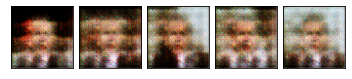

--- EPOCH 2/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.91it/s]
Discriminator loss: 0.5701660141700281
Generator loss:     6.225913828273989


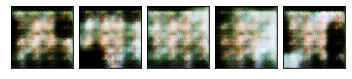

--- EPOCH 3/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  4.07it/s]
Discriminator loss: 0.5119297280204747
Generator loss:     5.358556219991648
saved model at epoch number 3 !
Saved checkpoint.


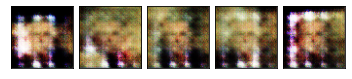

--- EPOCH 4/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  4.03it/s]
Discriminator loss: 0.5206835274145288
Generator loss:     5.714784318546079


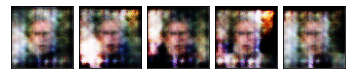

--- EPOCH 5/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.11it/s]
Discriminator loss: 0.6575871281466394
Generator loss:     5.773780989197065


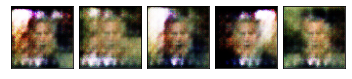

--- EPOCH 6/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  4.05it/s]
Discriminator loss: 0.47915805890312735
Generator loss:     5.520953209895008


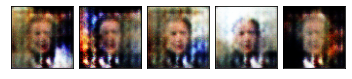

--- EPOCH 7/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.65it/s]
Discriminator loss: 0.625125497649863
Generator loss:     5.801062901065035


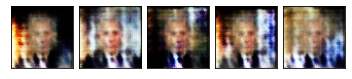

--- EPOCH 8/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  4.00it/s]
Discriminator loss: 0.4411310068208654
Generator loss:     5.74532433725753


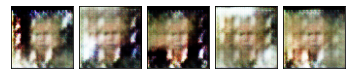

--- EPOCH 9/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.10it/s]
Discriminator loss: 0.618180827993267
Generator loss:     5.636184739616682


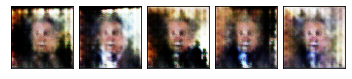

--- EPOCH 10/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  4.06it/s]
Discriminator loss: 0.5763675238726274
Generator loss:     5.759667657456308


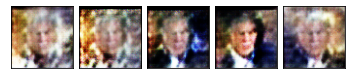

--- EPOCH 11/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  4.04it/s]
Discriminator loss: 0.5625330177399347
Generator loss:     6.0442700610970554


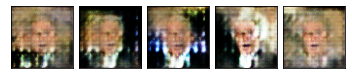

--- EPOCH 12/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.81it/s]
Discriminator loss: 0.5029841931712515
Generator loss:     5.665100547502625


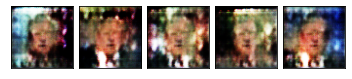

--- EPOCH 13/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  4.02it/s]
Discriminator loss: 0.5127459605628589
Generator loss:     5.762326392362702


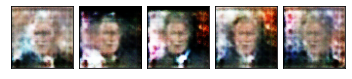

--- EPOCH 14/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.93it/s]
Discriminator loss: 0.5103917897520762
Generator loss:     5.569442794008075


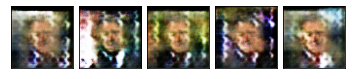

--- EPOCH 15/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.10it/s]
Discriminator loss: 0.462832556791463
Generator loss:     6.297250799412997


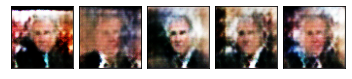

--- EPOCH 16/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.81it/s]
Discriminator loss: 0.47707676718819814
Generator loss:     5.626852802510531


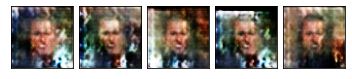

--- EPOCH 17/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  4.02it/s]
Discriminator loss: 0.5332120288655443
Generator loss:     6.164431540471203


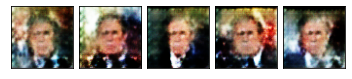

--- EPOCH 18/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.13it/s]
Discriminator loss: 0.33516450240364615
Generator loss:     5.918962303197609


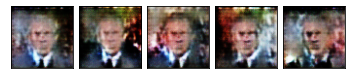

--- EPOCH 19/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.12it/s]
Discriminator loss: 0.5289262106360973
Generator loss:     6.615300907278961


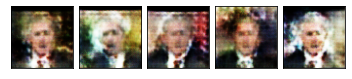

--- EPOCH 20/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.08it/s]
Discriminator loss: 0.4481192813869917
Generator loss:     6.156612504203364


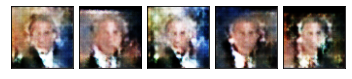

--- EPOCH 21/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.08it/s]
Discriminator loss: 0.5226439108966656
Generator loss:     5.9931956642078905


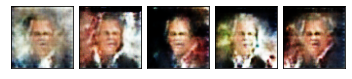

--- EPOCH 22/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  4.02it/s]
Discriminator loss: 0.3455085406466475
Generator loss:     6.134664908894953


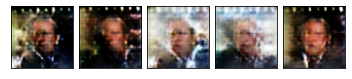

--- EPOCH 23/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  4.02it/s]
Discriminator loss: 0.5760434269553648
Generator loss:     6.379438737653336


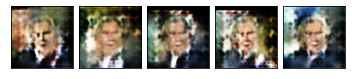

--- EPOCH 24/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.92it/s]
Discriminator loss: 0.3887473241478767
Generator loss:     5.25553901465434
saved model at epoch number 24 !
Saved checkpoint.


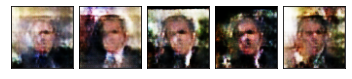

--- EPOCH 25/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  4.02it/s]
Discriminator loss: 0.3238263503419903
Generator loss:     5.433330364947049


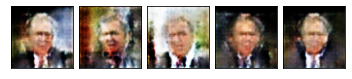

--- EPOCH 26/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.17it/s]
Discriminator loss: 0.2894815647939466
Generator loss:     5.491042901884835


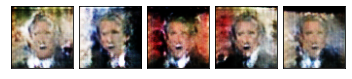

--- EPOCH 27/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.16it/s]
Discriminator loss: 0.24312213973476077
Generator loss:     6.59568083961055


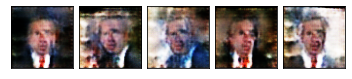

--- EPOCH 28/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.14it/s]
Discriminator loss: 0.41093010581889244
Generator loss:     6.595891211392744


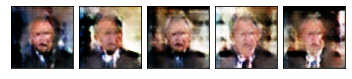

--- EPOCH 29/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.16it/s]
Discriminator loss: 0.26303002417509286
Generator loss:     6.451183458544174


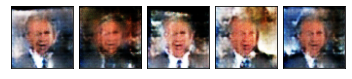

--- EPOCH 30/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.14it/s]
Discriminator loss: 0.36669308867938116
Generator loss:     6.256767810515638


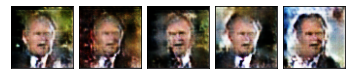

--- EPOCH 31/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.17it/s]
Discriminator loss: 0.2316619917961224
Generator loss:     6.745488425470748


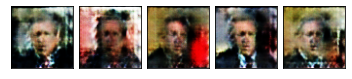

--- EPOCH 32/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.13it/s]
Discriminator loss: 0.21658162206833093
Generator loss:     7.108696717136311


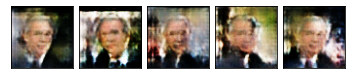

--- EPOCH 33/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.08it/s]
Discriminator loss: 0.4102870660640721
Generator loss:     6.807116007467486


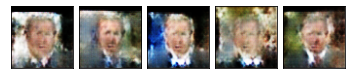

--- EPOCH 34/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.15it/s]
Discriminator loss: 0.3042441391438808
Generator loss:     6.031947947898001


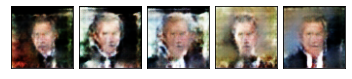

--- EPOCH 35/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.18it/s]
Discriminator loss: 0.243049201116247
Generator loss:     5.845261254400577


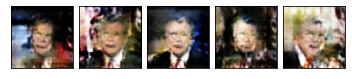

--- EPOCH 36/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.13it/s]
Discriminator loss: 0.23492670561766849
Generator loss:     6.412799868943556


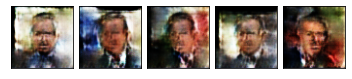

--- EPOCH 37/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.17it/s]
Discriminator loss: 0.30109710850805604
Generator loss:     6.932531001432887


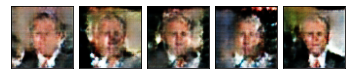

--- EPOCH 38/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.16it/s]
Discriminator loss: 0.2639529414756118
Generator loss:     6.766468806086846


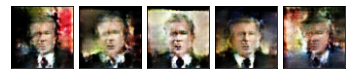

--- EPOCH 39/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.21it/s]
Discriminator loss: 0.2890676938278495
Generator loss:     6.881958201246442


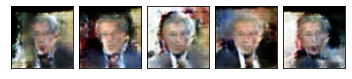

--- EPOCH 40/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.14it/s]
Discriminator loss: 0.2711104991019897
Generator loss:     7.672404410704127


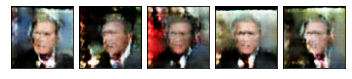

--- EPOCH 41/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.15it/s]
Discriminator loss: 0.3543769114844079
Generator loss:     6.3564037984272215


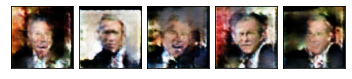

--- EPOCH 42/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.16it/s]
Discriminator loss: 0.19693631112997262
Generator loss:     5.886811701756604


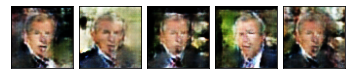

--- EPOCH 43/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.15it/s]
Discriminator loss: 0.22282761272113277
Generator loss:     7.373059637141678


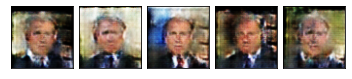

--- EPOCH 44/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.26it/s]
Discriminator loss: 0.2840041246546327
Generator loss:     7.311868260491569


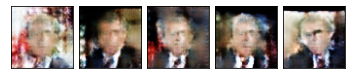

--- EPOCH 45/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.13it/s]
Discriminator loss: 0.12514282456370737
Generator loss:     6.289578707713001


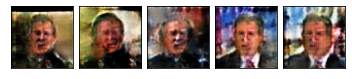

--- EPOCH 46/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.15it/s]
Discriminator loss: 0.3636832408044698
Generator loss:     7.531880947778809


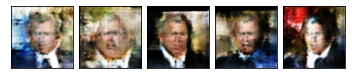

--- EPOCH 47/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.18it/s]
Discriminator loss: 0.38177034037433705
Generator loss:     7.012531478449984


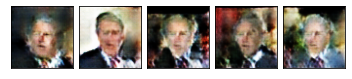

--- EPOCH 48/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.14it/s]
Discriminator loss: 0.16998144305961313
Generator loss:     6.3265435470725


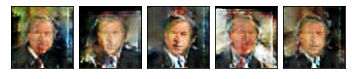

--- EPOCH 49/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.15it/s]
Discriminator loss: 0.1429363891201199
Generator loss:     7.657547010565704


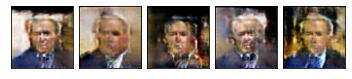

--- EPOCH 50/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.17it/s]
Discriminator loss: 0.12348055010134319
Generator loss:     7.5405784238059566


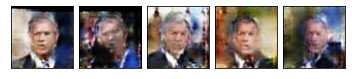

--- EPOCH 51/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.13it/s]
Discriminator loss: 0.10989112324380088
Generator loss:     6.731989329715945


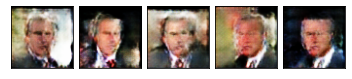

--- EPOCH 52/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.16it/s]
Discriminator loss: 0.1138723494818891
Generator loss:     8.05068302154541


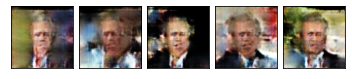

--- EPOCH 53/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.14it/s]
Discriminator loss: 0.14160603778612502
Generator loss:     7.493731251302755


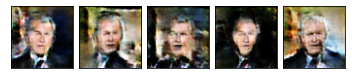

--- EPOCH 54/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.15it/s]
Discriminator loss: 0.446488556662961
Generator loss:     9.072749227847693


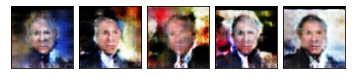

--- EPOCH 55/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.23it/s]
Discriminator loss: 0.19681851065032324
Generator loss:     6.924266473302302


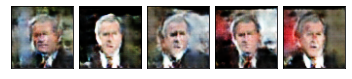

--- EPOCH 56/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.20it/s]
Discriminator loss: 0.2496328841464348
Generator loss:     7.74837597586074


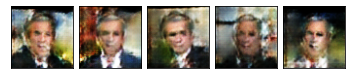

--- EPOCH 57/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.16it/s]
Discriminator loss: 0.27445935616093986
Generator loss:     7.6145942166166485


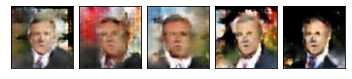

--- EPOCH 58/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.93it/s]
Discriminator loss: 0.26601233800767726
Generator loss:     7.0980487027258246


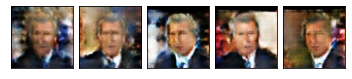

--- EPOCH 59/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.95it/s]
Discriminator loss: 0.10641095973551273
Generator loss:     6.58788537979126


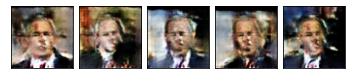

--- EPOCH 60/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  4.01it/s]
Discriminator loss: 0.1622808818301221
Generator loss:     7.517506077604474


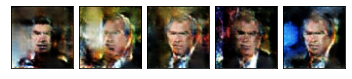

--- EPOCH 61/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.09it/s]
Discriminator loss: 0.1093142517086751
Generator loss:     6.610479660753934


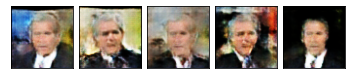

--- EPOCH 62/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.17it/s]
Discriminator loss: 0.29545388764367914
Generator loss:     7.163394030534996


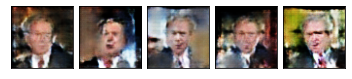

--- EPOCH 63/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.16it/s]
Discriminator loss: 0.13383367237028718
Generator loss:     7.1779144934888155


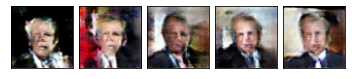

--- EPOCH 64/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.99it/s]
Discriminator loss: 0.17981281832633716
Generator loss:     8.02919226322534


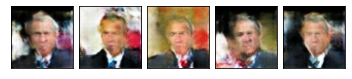

--- EPOCH 65/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.19it/s]
Discriminator loss: 0.2714635324576553
Generator loss:     8.062529608888447


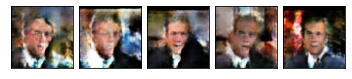

--- EPOCH 66/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.13it/s]
Discriminator loss: 0.2524913847622163
Generator loss:     7.719456078871241


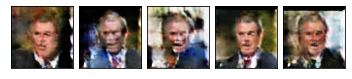

--- EPOCH 67/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.14it/s]
Discriminator loss: 0.2025085415620849
Generator loss:     7.893149092512311


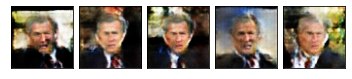

--- EPOCH 68/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.09it/s]
Discriminator loss: 0.22064548477811632
Generator loss:     7.295070007162274


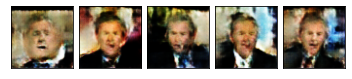

--- EPOCH 69/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.18it/s]
Discriminator loss: 0.13858763251523926
Generator loss:     7.172753468999323


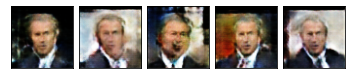

--- EPOCH 70/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.13it/s]
Discriminator loss: 0.12046844143209592
Generator loss:     6.90783765630902


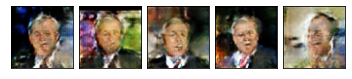

--- EPOCH 71/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.18it/s]
Discriminator loss: 0.15276298390806847
Generator loss:     7.440137809177615


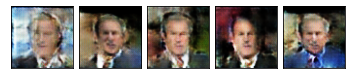

--- EPOCH 72/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.13it/s]
Discriminator loss: 0.20769634199732878
Generator loss:     8.461386545649114


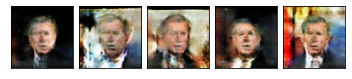

--- EPOCH 73/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.17it/s]
Discriminator loss: 0.25282047978901073
Generator loss:     8.154259776169399


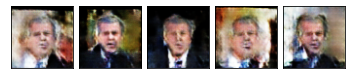

--- EPOCH 74/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.16it/s]
Discriminator loss: 0.1701995724249842
Generator loss:     7.32679505168267


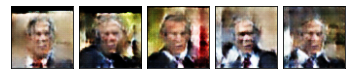

--- EPOCH 75/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.21it/s]
Discriminator loss: 0.12219951484563216
Generator loss:     7.036054039901158


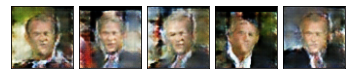

--- EPOCH 76/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.13it/s]
Discriminator loss: 0.08403218678146038
Generator loss:     8.190858400092935


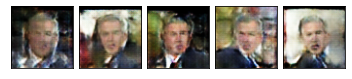

--- EPOCH 77/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  4.04it/s]
Discriminator loss: 0.1322255465289894
Generator loss:     8.634104031436848


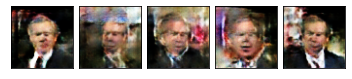

--- EPOCH 78/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.14it/s]
Discriminator loss: 0.3643660096557073
Generator loss:     8.738444017914107


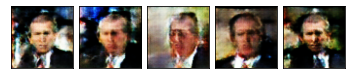

--- EPOCH 79/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.16it/s]
Discriminator loss: 0.4097509444251938
Generator loss:     8.232389216153127


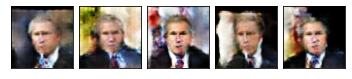

--- EPOCH 80/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.15it/s]
Discriminator loss: 0.21507100367321158
Generator loss:     6.330230384502771


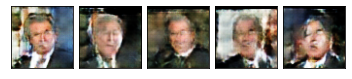

--- EPOCH 81/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.15it/s]
Discriminator loss: 0.12809138264471912
Generator loss:     6.74046382364237


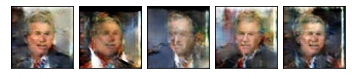

--- EPOCH 82/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.17it/s]
Discriminator loss: 0.0897176961572665
Generator loss:     7.635390362649594


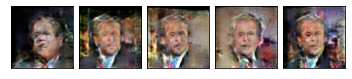

--- EPOCH 83/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.12it/s]
Discriminator loss: 0.17589456022207467
Generator loss:     8.586967981086588


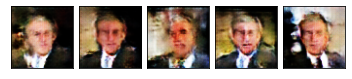

--- EPOCH 84/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.08it/s]
Discriminator loss: 0.11807837273995832
Generator loss:     7.250607369081029


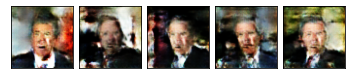

--- EPOCH 85/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.18it/s]
Discriminator loss: 0.1928297477897327
Generator loss:     8.111439039122384


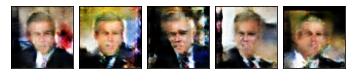

--- EPOCH 86/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  4.07it/s]
Discriminator loss: 0.10036232294339054
Generator loss:     6.605832383317767


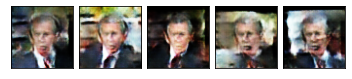

--- EPOCH 87/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.15it/s]
Discriminator loss: 0.35013467973133305
Generator loss:     8.953071297339672


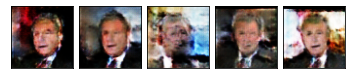

--- EPOCH 88/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.16it/s]
Discriminator loss: 0.2295071383903049
Generator loss:     7.262399138144727


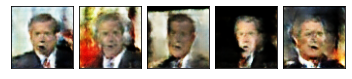

--- EPOCH 89/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.09it/s]
Discriminator loss: 0.1485622913207648
Generator loss:     7.5659222422905685


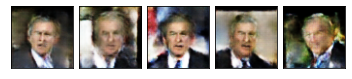

--- EPOCH 90/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.15it/s]
Discriminator loss: 0.15984618435350229
Generator loss:     7.636750293227862


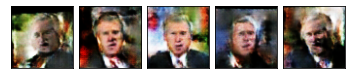

--- EPOCH 91/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.15it/s]
Discriminator loss: 0.08684434218086162
Generator loss:     6.787896048347905


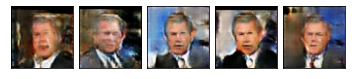

--- EPOCH 92/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.15it/s]
Discriminator loss: 0.10729498421896319
Generator loss:     7.620904135254194


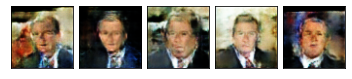

--- EPOCH 93/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.23it/s]
Discriminator loss: 0.11651475235538662
Generator loss:     6.692851552423441


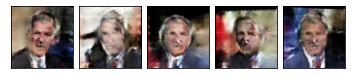

--- EPOCH 94/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.14it/s]
Discriminator loss: 0.0787281593624151
Generator loss:     7.131730673448095


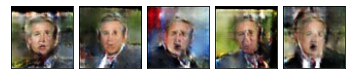

--- EPOCH 95/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.15it/s]
Discriminator loss: 0.19103796231859135
Generator loss:     8.355991035137537


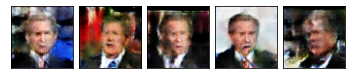

--- EPOCH 96/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.23it/s]
Discriminator loss: 0.285252740378228
Generator loss:     8.340971676808483


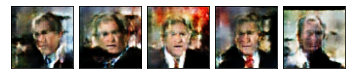

--- EPOCH 97/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.23it/s]
Discriminator loss: 0.16625609997449056
Generator loss:     7.264024986411041


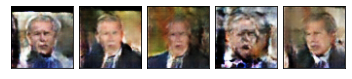

--- EPOCH 98/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.13it/s]
Discriminator loss: 0.09551219705421969
Generator loss:     7.189812066420069


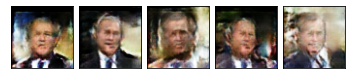

--- EPOCH 99/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:12<00:00,  4.14it/s]
Discriminator loss: 0.08544956268918402
Generator loss:     7.4395979575391085


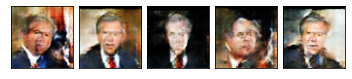

--- EPOCH 100/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.70it/s]
Discriminator loss: 0.25618007652602104
Generator loss:     8.849369602383307


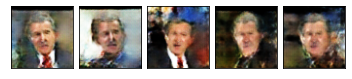

In [24]:
import cs3600.plot as plot
num_epochs = 100
fid_scores = []
#checkpoint_file = os.join(os.getcwd(),"GAN","checkpoint")

if os.path.isfile(f'{checkpoint_file_final}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final

try:
    dsc_avg_losses, gen_avg_losses = [], []
    for epoch_idx in range(num_epochs):
        # We'll accumulate batch losses and show an average once per epoch.
        dsc_losses, gen_losses = [], []
        print(f'--- EPOCH {epoch_idx+1}/{num_epochs} ---')

        with tqdm.tqdm(total=len(dl_train.batch_sampler), file=sys.stdout) as pbar:
            for batch_idx, (x_data, _) in enumerate(dl_train):
                save_fid_score(fid_scores,batch_idx,gen,x_data)
                x_data = x_data.to(device)
                dsc_loss, gen_loss = train_batch(
                    dsc, gen,
                    dsc_loss_fn, gen_loss_fn,
                    dsc_optimizer, gen_optimizer,
                    x_data)
                dsc_losses.append(dsc_loss)
                gen_losses.append(gen_loss)
                pbar.update()

        dsc_avg_losses.append(np.mean(dsc_losses))
        gen_avg_losses.append(np.mean(gen_losses))
        print(f'Discriminator loss: {dsc_avg_losses[-1]}')
        print(f'Generator loss:     {gen_avg_losses[-1]}')
        
        if save_checkpoint(gen, dsc_avg_losses, gen_avg_losses, checkpoint_file):
            print(f'Saved checkpoint.')
            

        samples = gen.sample(5, with_grad=False)
        fig, _ = plot.tensors_as_images(samples.cpu(), figsize=(6,2))
        IPython.display.display(fig)

        if (epoch_idx % 3 == 0):
            image_path = os.path.join("GAN-Images",str(epoch_idx))
            image_path = create_picture_path(image_path)
            
            plt.savefig(image_path)
        plt.close(fig)
except KeyboardInterrupt as e:
    print('\n *** Training interrupted by user')

Plot and save fid score per epoch

[374.4955425364956, 474.75372334742167, 381.6145521545406, 412.86261329638046, 430.4740297935905, 361.5764342827139, 410.81898298284517, 382.70793865687966, 434.028755953973, 371.5756790077114, 417.56992360523606, 348.9143040041786, 435.5399704637274, 373.93819971049084, 450.7225731122734, 416.4714837944072, 371.96826482765283, 316.59054157784686, 278.3106771658944, 315.5759059737385, 358.0899501811768, 305.9524752573656, 364.3817976063629, 346.80621004470896, 267.50924042732436, 280.678922167943, 336.52771995109373, 315.3613750684063, 253.32675227362074, 242.17547485211165, 249.0754116912115, 230.92216433929522, 288.40839360839465, 251.5182783538779, 299.11884791118706, 363.3541171003634, 262.8614760119184, 325.7399534924936, 270.15906594381096, 299.6533780499143, 257.0630156350275, 310.55592465166984, 253.44181679171322, 198.35426192316987, 324.45110970188654, 203.21218202906144, 239.0682550500614, 264.12411843417976, 268.8603981382408, 303.77738868057736, 287.94667710482213, 247.497

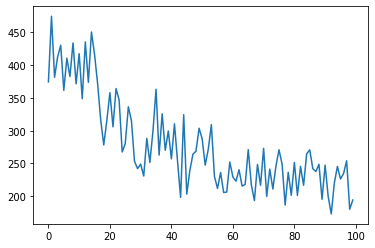

In [25]:
print(fid_scores)

plot = plt.plot(fid_scores)
plt.savefig("GAN_fid.png")
plt.close(fig)


# Spectral Normalization Gan

Using device: cuda
File C:\Users\nitsa\.pytorch-datasets\lfw-bush.zip exists, skipping download.
Extracting C:\Users\nitsa\.pytorch-datasets\lfw-bush.zip...
Extracted 531 to C:\Users\nitsa\.pytorch-datasets\lfw/George_W_Bush
{'batch_size': 10, 'z_dim': 200, 'data_label': 0, 'label_noise': 0.1, 'discriminator_optimizer': {'type': 'Adam', 'lr': 0.0002, 'betas': (0.5, 0.999), 'weight_decay': 0.001}, 'generator_optimizer': {'type': 'Adam', 'lr': 0.0004, 'betas': (0.5, 0.999), 'weight_decay': 0.001}}
--- EPOCH 1/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:18<00:00,  2.79it/s]
Discriminator loss: 0.7598591300676454
Generator loss:     2.777964579609205


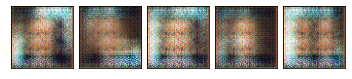

--- EPOCH 2/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.67it/s]
Discriminator loss: 1.1086706125511314
Generator loss:     1.0825170368518469
saved model at epoch number 2 !
Saved checkpoint.


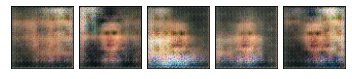

--- EPOCH 3/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.80it/s]
Discriminator loss: 1.2110456385702457
Generator loss:     0.9311470715504773
saved model at epoch number 3 !
Saved checkpoint.


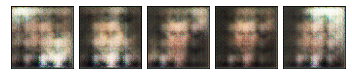

--- EPOCH 4/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.68it/s]
Discriminator loss: 1.1964871163638133
Generator loss:     0.9030952948444294
saved model at epoch number 4 !
Saved checkpoint.


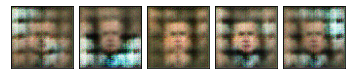

--- EPOCH 5/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:15<00:00,  3.53it/s]
Discriminator loss: 1.2078320147856227
Generator loss:     0.8788201449052343
saved model at epoch number 5 !
Saved checkpoint.


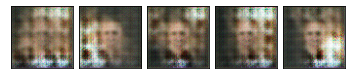

--- EPOCH 6/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.75it/s]
Discriminator loss: 1.2219199448261622
Generator loss:     0.9043828305208458


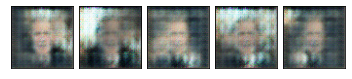

--- EPOCH 7/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.67it/s]
Discriminator loss: 1.2085026525101572
Generator loss:     0.9212174741727002


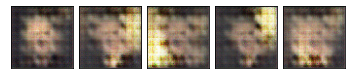

--- EPOCH 8/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.66it/s]
Discriminator loss: 1.1829421362786923
Generator loss:     0.9087163727238493


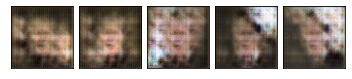

--- EPOCH 9/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.70it/s]
Discriminator loss: 1.1848502136626333
Generator loss:     0.8908373567293275


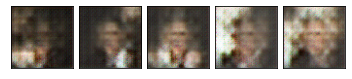

--- EPOCH 10/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.60it/s]
Discriminator loss: 1.1781528547125042
Generator loss:     0.907379613732392


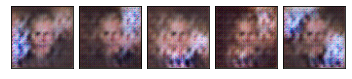

--- EPOCH 11/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.65it/s]
Discriminator loss: 1.21315724219916
Generator loss:     0.8416102472341286
saved model at epoch number 11 !
Saved checkpoint.


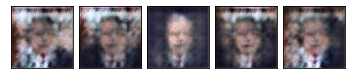

--- EPOCH 12/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:15<00:00,  3.45it/s]
Discriminator loss: 1.1480080620297846
Generator loss:     0.8758694360840995


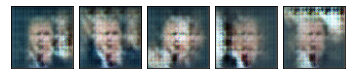

--- EPOCH 13/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.73it/s]
Discriminator loss: 1.153363992583077
Generator loss:     0.8683909054072398


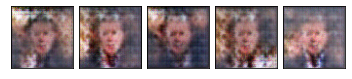

--- EPOCH 14/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.83it/s]
Discriminator loss: 1.1135100935989957
Generator loss:     0.8664129275196003


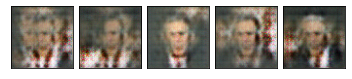

--- EPOCH 15/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.79it/s]
Discriminator loss: 1.156280204934894
Generator loss:     0.9064709150566245


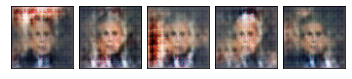

--- EPOCH 16/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.84it/s]
Discriminator loss: 1.0902995602139887
Generator loss:     0.901309202302177


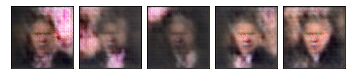

--- EPOCH 17/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.78it/s]
Discriminator loss: 1.0772192253256745
Generator loss:     0.9099636145357816


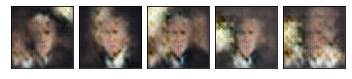

--- EPOCH 18/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.61it/s]
Discriminator loss: 1.0295827208824877
Generator loss:     0.9366752640256342


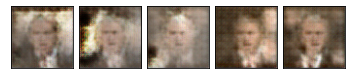

--- EPOCH 19/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.69it/s]
Discriminator loss: 1.0279064909467157
Generator loss:     0.992679219200926


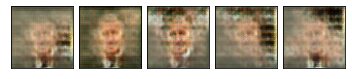

--- EPOCH 20/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.63it/s]
Discriminator loss: 1.0055416608756442
Generator loss:     0.8962947793726651


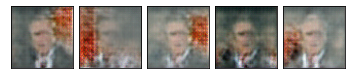

--- EPOCH 21/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.81it/s]
Discriminator loss: 0.9795329503293307
Generator loss:     0.9985241620045788


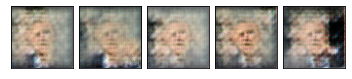

--- EPOCH 22/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:11<00:00,  4.50it/s]
Discriminator loss: 0.9602461614698734
Generator loss:     0.8807334528779084


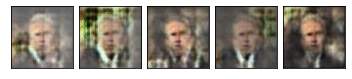

--- EPOCH 23/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.78it/s]
Discriminator loss: 1.016697591205813
Generator loss:     0.94862392376054


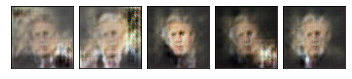

--- EPOCH 24/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.77it/s]
Discriminator loss: 1.0064155954235006
Generator loss:     0.9002036126154773


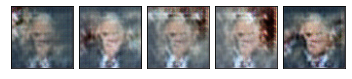

--- EPOCH 25/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:15<00:00,  3.49it/s]
Discriminator loss: 0.9741888597326459
Generator loss:     0.8795817696823264


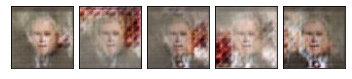

--- EPOCH 26/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:15<00:00,  3.46it/s]
Discriminator loss: 0.942260983979927
Generator loss:     1.0015677888438386


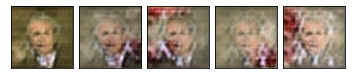

--- EPOCH 27/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:16<00:00,  3.30it/s]
Discriminator loss: 0.9469061077765699
Generator loss:     0.901640497288614


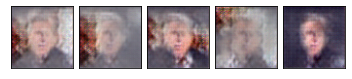

--- EPOCH 28/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:15<00:00,  3.49it/s]
Discriminator loss: 0.8986993015937086
Generator loss:     0.9856216109023904


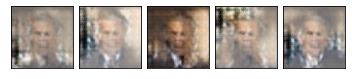

--- EPOCH 29/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.56it/s]
Discriminator loss: 0.9195739908038445
Generator loss:     0.9251502741057918


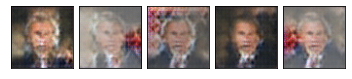

--- EPOCH 30/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:15<00:00,  3.49it/s]
Discriminator loss: 0.9110729761843411
Generator loss:     0.9126503220144307


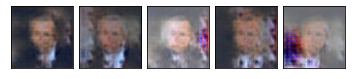

--- EPOCH 31/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.54it/s]
Discriminator loss: 0.8612764893837694
Generator loss:     0.9825255229788007


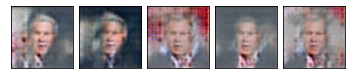

--- EPOCH 32/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.78it/s]
Discriminator loss: 0.8846336749364745
Generator loss:     0.9419892351582365


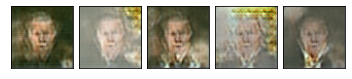

--- EPOCH 33/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.82it/s]
Discriminator loss: 0.8833189190558668
Generator loss:     0.9712102244485099


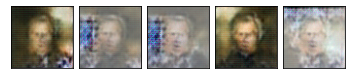

--- EPOCH 34/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.81it/s]
Discriminator loss: 0.8460464691216091
Generator loss:     0.9677192253886528


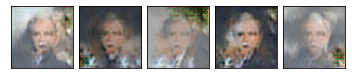

--- EPOCH 35/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.74it/s]
Discriminator loss: 0.8545640099723384
Generator loss:     0.935887798948108


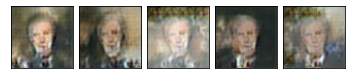

--- EPOCH 36/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.80it/s]
Discriminator loss: 0.8363476620530182
Generator loss:     0.965461327782217


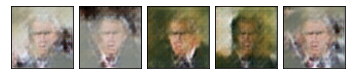

--- EPOCH 37/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.78it/s]
Discriminator loss: 0.8275816226905247
Generator loss:     0.8915392121054092


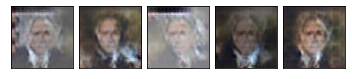

--- EPOCH 38/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.73it/s]
Discriminator loss: 0.9075835369667917
Generator loss:     0.8062197082447555
saved model at epoch number 38 !
Saved checkpoint.


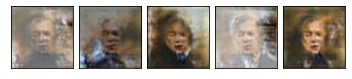

--- EPOCH 39/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.75it/s]
Discriminator loss: 0.8143022971333198
Generator loss:     0.9757315269056356


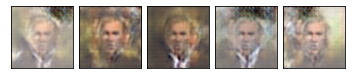

--- EPOCH 40/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.82it/s]
Discriminator loss: 0.7924432799501239
Generator loss:     1.019850863600677


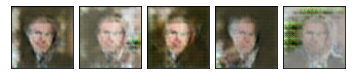

--- EPOCH 41/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.80it/s]
Discriminator loss: 0.7639847184127232
Generator loss:     1.027243415139756


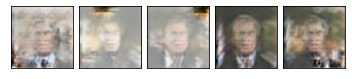

--- EPOCH 42/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.77it/s]
Discriminator loss: 0.7705309053636947
Generator loss:     1.0096568960063863


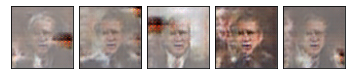

--- EPOCH 43/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.81it/s]
Discriminator loss: 0.7842079097369932
Generator loss:     0.9703593580227978


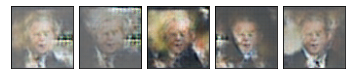

--- EPOCH 44/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.80it/s]
Discriminator loss: 0.7424159567311125
Generator loss:     1.0355009200438015


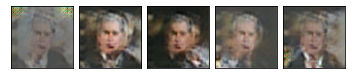

--- EPOCH 45/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.78it/s]
Discriminator loss: 0.7147711920288374
Generator loss:     1.0371133567027326


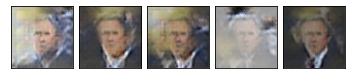

--- EPOCH 46/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.72it/s]
Discriminator loss: 0.7518369999696624
Generator loss:     1.0080617834936898


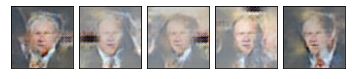

--- EPOCH 47/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.81it/s]
Discriminator loss: 0.775375283551666
Generator loss:     0.9322969249959262


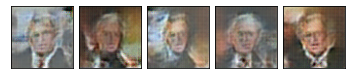

--- EPOCH 48/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.80it/s]
Discriminator loss: 0.777725765165293
Generator loss:     0.8913663074655352


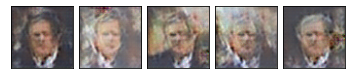

--- EPOCH 49/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.65it/s]
Discriminator loss: 0.7351396612401279
Generator loss:     0.9324704566091861


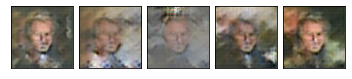

--- EPOCH 50/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.57it/s]
Discriminator loss: 0.7404689097179556
Generator loss:     0.9160949514721924


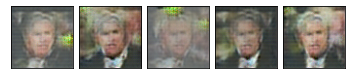

--- EPOCH 51/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.79it/s]
Discriminator loss: 0.7615158614122642
Generator loss:     0.8525380413487272


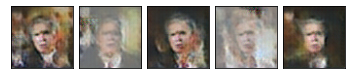

--- EPOCH 52/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.66it/s]
Discriminator loss: 0.7406397118883313
Generator loss:     0.8839580259233151


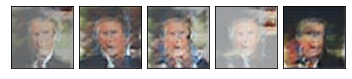

--- EPOCH 53/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.80it/s]
Discriminator loss: 0.7708981981817281
Generator loss:     0.850750779205898


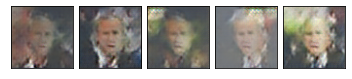

--- EPOCH 54/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.73it/s]
Discriminator loss: 0.7374426385141769
Generator loss:     0.870753620593053


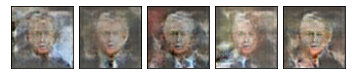

--- EPOCH 55/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.65it/s]
Discriminator loss: 0.7591672168587739
Generator loss:     0.8251776436589798


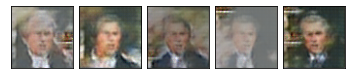

--- EPOCH 56/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.62it/s]
Discriminator loss: 0.7747189335103305
Generator loss:     0.7872213799998445
saved model at epoch number 56 !
Saved checkpoint.


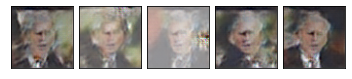

--- EPOCH 57/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.79it/s]
Discriminator loss: 0.7831632337480221
Generator loss:     0.7902619478837499


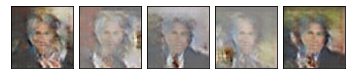

--- EPOCH 58/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.84it/s]
Discriminator loss: 0.7796201222347763
Generator loss:     0.8023723791230399


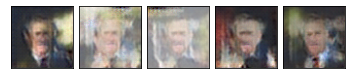

--- EPOCH 59/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.77it/s]
Discriminator loss: 0.7296140014000658
Generator loss:     0.8541426085076242


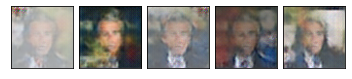

--- EPOCH 60/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.72it/s]
Discriminator loss: 0.8050300816320023
Generator loss:     0.7986366861271408


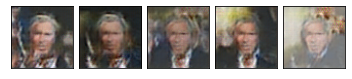

--- EPOCH 61/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.62it/s]
Discriminator loss: 0.7573796926804308
Generator loss:     0.7958291510366043


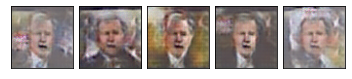

--- EPOCH 62/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.56it/s]
Discriminator loss: 0.785576933959745
Generator loss:     0.7700902234833196
saved model at epoch number 62 !
Saved checkpoint.


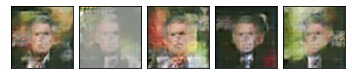

--- EPOCH 63/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.72it/s]
Discriminator loss: 0.7871711467796901
Generator loss:     0.7790726299555797


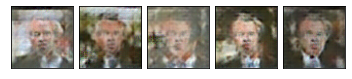

--- EPOCH 64/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.76it/s]
Discriminator loss: 0.7423797530947991
Generator loss:     0.8496953181500705


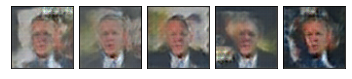

--- EPOCH 65/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.79it/s]
Discriminator loss: 0.7681839409864174
Generator loss:     0.7869538046279043


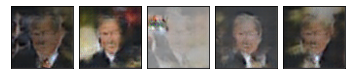

--- EPOCH 66/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.80it/s]
Discriminator loss: 0.7644866181994384
Generator loss:     0.7848218915597448


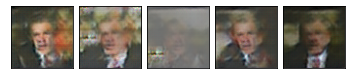

--- EPOCH 67/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.87it/s]
Discriminator loss: 0.7400329574099127
Generator loss:     0.8179180554623874


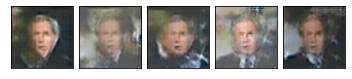

--- EPOCH 68/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.78it/s]
Discriminator loss: 0.8114478290081024
Generator loss:     0.8269913921941001


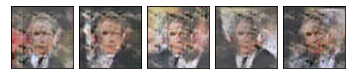

--- EPOCH 69/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.69it/s]
Discriminator loss: 0.8966746262784274
Generator loss:     0.6937475339421686
saved model at epoch number 69 !
Saved checkpoint.


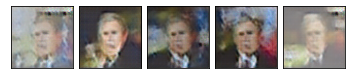

--- EPOCH 70/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.65it/s]
Discriminator loss: 0.7840787689640837
Generator loss:     0.7256103169243291


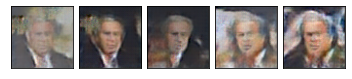

--- EPOCH 71/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.74it/s]
Discriminator loss: 0.7695512580421736
Generator loss:     0.7262759444848547


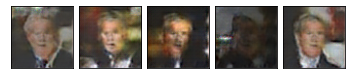

--- EPOCH 72/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.75it/s]
Discriminator loss: 0.7884749522748983
Generator loss:     0.7099901404020921


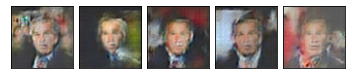

--- EPOCH 73/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.83it/s]
Discriminator loss: 0.7652562766704919
Generator loss:     0.720080924483965


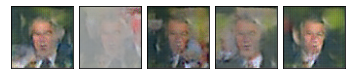

--- EPOCH 74/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.69it/s]
Discriminator loss: 0.7553909555921015
Generator loss:     0.7362541342681309


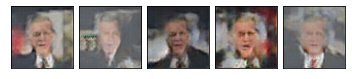

--- EPOCH 75/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.83it/s]
Discriminator loss: 0.8014020492445748
Generator loss:     0.7248756390697552


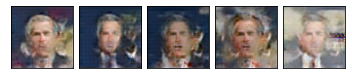

--- EPOCH 76/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.86it/s]
Discriminator loss: 0.7965019536468217
Generator loss:     0.7234236485553238


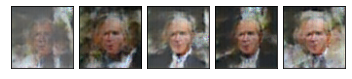

--- EPOCH 77/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.81it/s]
Discriminator loss: 0.7811182411211841
Generator loss:     0.7328711736877009


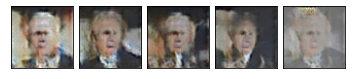

--- EPOCH 78/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.62it/s]
Discriminator loss: 0.7800184971881363
Generator loss:     0.7475740077360621


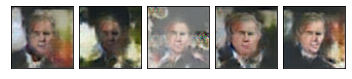

--- EPOCH 79/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.60it/s]
Discriminator loss: 0.7605611299568752
Generator loss:     0.8104868778642619


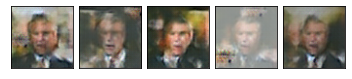

--- EPOCH 80/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.74it/s]
Discriminator loss: 0.7487237048598955
Generator loss:     0.7997821614427386


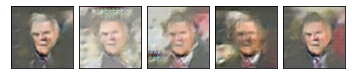

--- EPOCH 81/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.69it/s]
Discriminator loss: 0.6359145587907648
Generator loss:     0.955988846859842


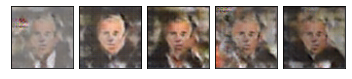

--- EPOCH 82/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.76it/s]
Discriminator loss: 0.6826051771640778
Generator loss:     0.774352288471078


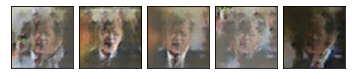

--- EPOCH 83/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.73it/s]
Discriminator loss: 0.7504802132552525
Generator loss:     0.7377970668504823


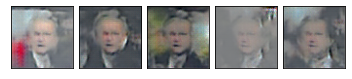

--- EPOCH 84/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.63it/s]
Discriminator loss: 0.7337630087474607
Generator loss:     0.7468037537808688


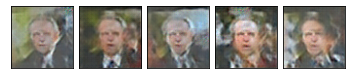

--- EPOCH 85/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.78it/s]
Discriminator loss: 0.7458101241093762
Generator loss:     0.7543983088349396


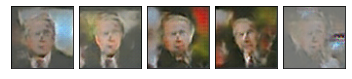

--- EPOCH 86/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.76it/s]
Discriminator loss: 0.7810403738381728
Generator loss:     0.7285067034217546


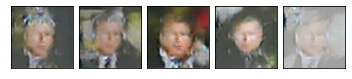

--- EPOCH 87/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.79it/s]
Discriminator loss: 0.7357562161841482
Generator loss:     0.7709617738453847


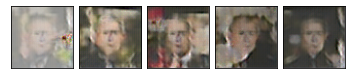

--- EPOCH 88/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.78it/s]
Discriminator loss: 0.7459064193491666
Generator loss:     0.7469224671147904


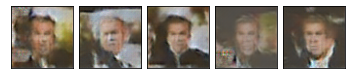

--- EPOCH 89/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.72it/s]
Discriminator loss: 0.7793909412509991
Generator loss:     0.7240312065718308


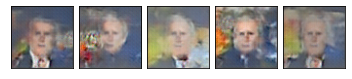

--- EPOCH 90/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.66it/s]
Discriminator loss: 0.7606913098749125
Generator loss:     0.7218625061916855


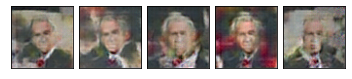

--- EPOCH 91/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.55it/s]
Discriminator loss: 0.7642784984606616
Generator loss:     0.7240979637739793


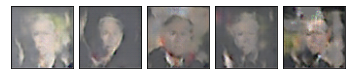

--- EPOCH 92/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.61it/s]
Discriminator loss: 0.7622703808658527
Generator loss:     0.7002284515578792


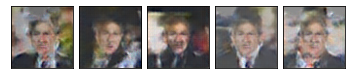

--- EPOCH 93/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.82it/s]
Discriminator loss: 0.7854463064445639
Generator loss:     0.7078774503941806


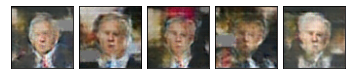

--- EPOCH 94/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.82it/s]
Discriminator loss: 0.7664751747869095
Generator loss:     0.7105272176130762


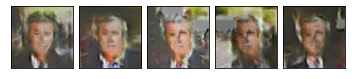

--- EPOCH 95/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.83it/s]
Discriminator loss: 0.8450185161716534
Generator loss:     0.6942445635795593


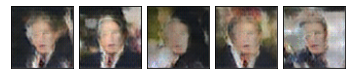

--- EPOCH 96/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.82it/s]
Discriminator loss: 0.8220641073190941
Generator loss:     0.7112026338307362


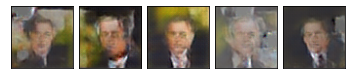

--- EPOCH 97/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:13<00:00,  3.81it/s]
Discriminator loss: 0.7764935549700035
Generator loss:     0.7021883208796663


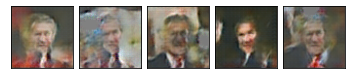

--- EPOCH 98/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.69it/s]
Discriminator loss: 0.7855532225572838
Generator loss:     0.7032042460621528


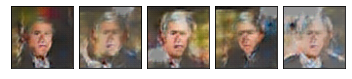

--- EPOCH 99/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.71it/s]
Discriminator loss: 0.7777557136877528
Generator loss:     0.7063218433901949


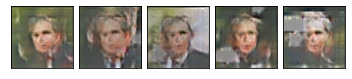

--- EPOCH 100/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:14<00:00,  3.78it/s]
Discriminator loss: 0.7654160812215985
Generator loss:     0.7216862338893818


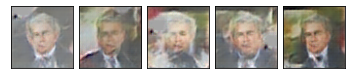

In [8]:
import cs3600.plot as plot
num_epochs = 100
plt.rcParams.update({'font.size': 12})
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)


DATA_DIR = pathlib.Path.home().joinpath('.pytorch-datasets')
if CUSTOM_DATA_URL is None:
    DATA_URL = 'http://vis-www.cs.umass.edu/lfw/lfw-bush.zip'
else:
    DATA_URL = CUSTOM_DATA_URL

_, dataset_dir = cs3600.download.download_data(out_path=DATA_DIR, url=DATA_URL, extract=True, force=False)

im_size = 64
tf = T.Compose([
    # Resize to constant spatial dimensions
    T.Resize((im_size, im_size)),
    # PIL.Image -> torch.Tensor
    T.ToTensor(),
    # Dynamic range [0,1] -> [-1, 1]
    T.Normalize(mean=(.5,.5,.5), std=(.5,.5,.5)),
])

ds_gwb = ImageFolder(os.path.dirname(dataset_dir), tf)

torch.manual_seed(42)

# Hyperparams
hp = hyperparams.sn_gan_hyperparams()
print(hp)
batch_size = hp['batch_size']
z_dim = hp['z_dim']

# Data
dl_train = DataLoader(ds_gwb, batch_size, shuffle=True)
im_size = ds_gwb[0][0].shape

# Model
dsc = gan.SpectralNormalizationDiscriminator(im_size).to(device)
gen = gan.Generator(z_dim, featuremap_size=4).to(device)
#print(gen)
# Optimizer
def create_optimizer(model_params, opt_params):
    opt_params = opt_params.copy()
    optimizer_type = opt_params['type']
    opt_params.pop('type')
    return optim.__dict__[optimizer_type](model_params, **opt_params)
dsc_optimizer = create_optimizer(dsc.parameters(), hp['discriminator_optimizer'])

gen_optimizer = create_optimizer(gen.parameters(), hp['generator_optimizer'])

# Loss
def dsc_loss_fn(y_data, y_generated):
    return gan.discriminator_loss_fn(y_data, y_generated, hp['data_label'], hp['label_noise'])

def gen_loss_fn(y_generated):
    return gan.generator_loss_fn(y_generated, hp['data_label'])

fid_scores = []
# Training
checkpoint_file = 'checkpoints/sngan'
checkpoint_file_final = f'{checkpoint_file}_final'


if os.path.isfile(f'{checkpoint_file_final}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final

try:
    dsc_avg_losses, gen_avg_losses = [], []
    for epoch_idx in range(num_epochs):
      
        # We'll accumulate batch losses and show an average once per epoch.
        dsc_losses, gen_losses = [], []
        print(f'--- EPOCH {epoch_idx+1}/{num_epochs} ---')

        with tqdm.tqdm(total=len(dl_train.batch_sampler), file=sys.stdout) as pbar:
            for batch_idx, (x_data, _) in enumerate(dl_train):
                save_fid_score(fid_scores,batch_idx,gen,x_data)
                x_data = x_data.to(device)
                dsc_loss, gen_loss = train_batch(
                    dsc, gen,
                    dsc_loss_fn, gen_loss_fn,
                    dsc_optimizer, gen_optimizer,
                    x_data)
                dsc_losses.append(dsc_loss)
                gen_losses.append(gen_loss)
                pbar.update()

        dsc_avg_losses.append(np.mean(dsc_losses))
        gen_avg_losses.append(np.mean(gen_losses))
        print(f'Discriminator loss: {dsc_avg_losses[-1]}')
        print(f'Generator loss:     {gen_avg_losses[-1]}')
        
        if save_checkpoint(gen, dsc_avg_losses, gen_avg_losses, checkpoint_file):
            print(f'Saved checkpoint.')
            
        samples = gen.sample(5, with_grad=False)
        
        fig, _ = plot.tensors_as_images(samples.cpu(), figsize=(6,2))

        IPython.display.display(fig)

        if (epoch_idx % 3 == 0):
            image_path = os.path.join("SN-GAN-Images",str(epoch_idx))
            image_path = create_picture_path(image_path)
            
            plt.savefig(image_path)
        plt.close(fig)

      
        
except KeyboardInterrupt as e:
    print('\n *** Training interrupted by user')


[388.41099967452203, 427.22456468442675, 374.4392786216996, 358.5367154989513, 458.65505902000547, 364.4735010015593, 379.322199469774, 388.84422601619207, 402.1041260195613, 413.13747065042116, 464.83312638344364, 431.2364833247011, 393.9718734255146, 408.46567901249404, 423.7174039596821, 425.1698131442176, 411.6277207607408, 363.0020911014423, 359.0940226292722, 330.03358348590075, 390.1774421243384, 369.6576842941643, 340.17347188937697, 377.11929364626076, 411.570090918116, 355.65316979555354, 344.2531002287536, 369.2621254187343, 382.99885234734415, 303.82681140891, 378.599136220918, 368.2798126192645, 352.81132812487095, 352.0061257692084, 410.77666448299567, 355.479836995223, 281.36082152271064, 309.52345994144383, 285.0354466960785, 287.17884584556106, 336.64025383056855, 337.03636724725453, 313.55136067302, 301.5632585072998, 307.49833441288274, 264.4017282264789, 256.60726953062283, 274.31553358451947, 399.6915646135441, 309.8985088711799, 273.23073699161796, 320.65894025321

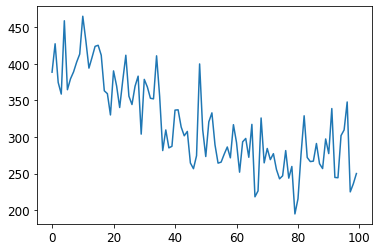

In [9]:
print(fid_scores)

plot = plt.plot(fid_scores)
plt.savefig("SNGAN_fid.png")
plt.close(fig)


# WGAN

Setting up model and parameters for training

In [7]:
import cs3600.plot as plot
torch.manual_seed(42)

# Hyperparams
hp = hyperparams.wgan_hyperparams()
batch_size = hp['batch_size']
z_dim = hp['z_dim']
critic_iterations = hp['critic_iterations']
clip_value = hp['clip_value']

# Data
dl_train = DataLoader(ds_gwb, batch_size, shuffle=True)
im_size = ds_gwb[0][0].shape

# Model
dsc = gan.Discriminator(im_size).to(device)
print(dsc)
gen = gan.Generator(z_dim, featuremap_size=4).to(device)

# Optimizer
def create_optimizer(model_params, opt_params):
    opt_params = opt_params.copy()
    optimizer_type = opt_params['type']
    opt_params.pop('type')
    return optim.__dict__[optimizer_type](model_params, **opt_params)
dsc_optimizer = create_optimizer(dsc.parameters(), hp['discriminator_optimizer'])
print(dsc_optimizer)
gen_optimizer = create_optimizer(gen.parameters(), hp['generator_optimizer'])

# Loss
def dsc_loss_fn(y_data, y_generated):
    return critic_loss_function(y_data, y_generated)

def gen_loss_fn(y_generated):
    return generator_loss_function(y_generated)

# Training
checkpoint_file = 'checkpoints/wgan'
checkpoint_file_final = f'{checkpoint_file}_final'
if os.path.isfile(f'{checkpoint_file}.pt'):
    os.remove(f'{checkpoint_file}.pt')

# Show hypers
print(hp)

Discriminator(
  (discriminator): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(64, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): Conv2d(512, 1024, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2, inplace=True)
    (12): Conv2d(1024, 1, k

Training

--- EPOCH 1/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:24<00:00,  2.15it/s]
Discriminator loss: -2.332106152233088
Generator loss:     1.094450590745458


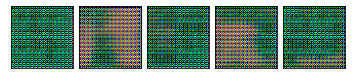

--- EPOCH 2/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:20<00:00,  2.62it/s]
Discriminator loss: -2.5329018797514573
Generator loss:     1.144307053296493


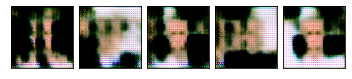

--- EPOCH 3/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:20<00:00,  2.60it/s]
Discriminator loss: -1.0812768427268513
Generator loss:     0.3601135638946632
saved model at epoch number 3 !
Saved checkpoint.


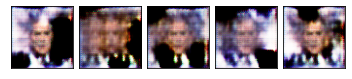

--- EPOCH 4/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:20<00:00,  2.55it/s]
Discriminator loss: -0.7928923261615465
Generator loss:     0.2087393903155934
saved model at epoch number 4 !
Saved checkpoint.


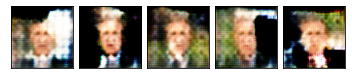

--- EPOCH 5/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:20<00:00,  2.54it/s]
Discriminator loss: -0.9282418268750299
Generator loss:     0.32326096109606606


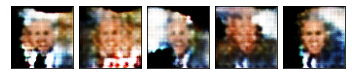

--- EPOCH 6/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:24<00:00,  2.20it/s]
Discriminator loss: -1.0586808042706184
Generator loss:     0.4719634414057441


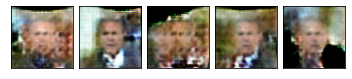

--- EPOCH 7/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.31it/s]
Discriminator loss: -1.1268372524459407
Generator loss:     0.5114128216540985


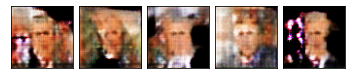

--- EPOCH 8/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.40it/s]
Discriminator loss: -1.23296335395777
Generator loss:     0.5061897676227227


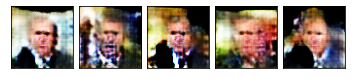

--- EPOCH 9/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.45it/s]
Discriminator loss: -1.3073090011218809
Generator loss:     0.5383221920017364


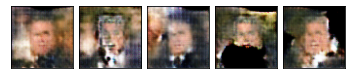

--- EPOCH 10/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.50it/s]
Discriminator loss: -1.4013537955733966
Generator loss:     0.5981013385649279


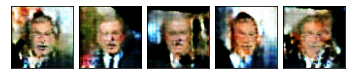

--- EPOCH 11/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.40it/s]
Discriminator loss: -1.4025370714799412
Generator loss:     0.6258836261365773


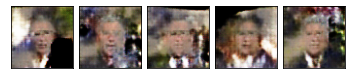

--- EPOCH 12/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.39it/s]
Discriminator loss: -1.4168974813425317
Generator loss:     0.6766809449654143


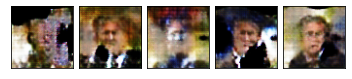

--- EPOCH 13/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.49it/s]
Discriminator loss: -1.485415852294778
Generator loss:     0.6599081563499739


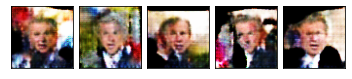

--- EPOCH 14/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.39it/s]
Discriminator loss: -1.5209147705222077
Generator loss:     0.6995790576175699


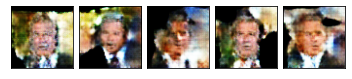

--- EPOCH 15/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.35it/s]
Discriminator loss: -1.5552164788516063
Generator loss:     0.6814291979063232


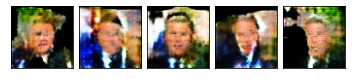

--- EPOCH 16/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.50it/s]
Discriminator loss: -1.6049714493301679
Generator loss:     0.7551288211120749


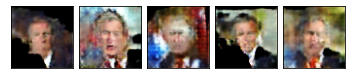

--- EPOCH 17/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.43it/s]
Discriminator loss: -1.6425811592138038
Generator loss:     0.7661666888084684


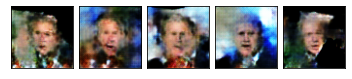

--- EPOCH 18/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:23<00:00,  2.30it/s]
Discriminator loss: -1.668118566836951
Generator loss:     0.7789631137308085


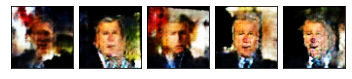

--- EPOCH 19/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:23<00:00,  2.28it/s]
Discriminator loss: -1.6617062789089274
Generator loss:     0.8008356229314264


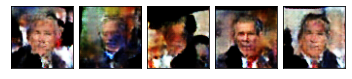

--- EPOCH 20/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:19<00:00,  2.78it/s]
Discriminator loss: -1.7544593091280956
Generator loss:     0.8014169267888339


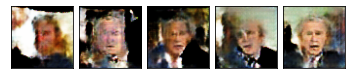

--- EPOCH 21/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:17<00:00,  2.97it/s]
Discriminator loss: -1.751646766122782
Generator loss:     0.818441963420724


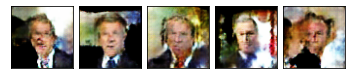

--- EPOCH 22/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:17<00:00,  2.95it/s]
Discriminator loss: -1.7647737264633179
Generator loss:     0.8308617461402461


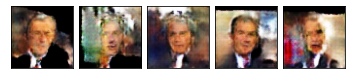

--- EPOCH 23/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:18<00:00,  2.81it/s]
Discriminator loss: -1.7823591097345892
Generator loss:     0.8318067519169934


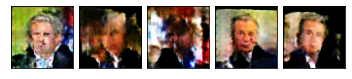

--- EPOCH 24/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.40it/s]
Discriminator loss: -1.8350049414724674
Generator loss:     0.8454895936093241


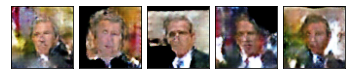

--- EPOCH 25/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.35it/s]
Discriminator loss: -1.8486572054197203
Generator loss:     0.8570563309597519


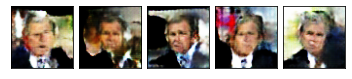

--- EPOCH 26/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.37it/s]
Discriminator loss: -1.8520845849558991
Generator loss:     0.847814401927984


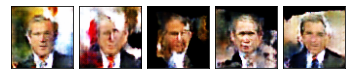

--- EPOCH 27/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.34it/s]
Discriminator loss: -1.8824591434226845
Generator loss:     0.841754177831254


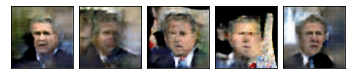

--- EPOCH 28/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.35it/s]
Discriminator loss: -1.8694196174729545
Generator loss:     0.8582055220064128


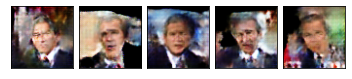

--- EPOCH 29/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.38it/s]
Discriminator loss: -1.8931610021951064
Generator loss:     0.8866534188108625


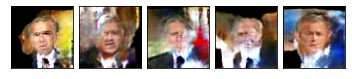

--- EPOCH 30/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.42it/s]
Discriminator loss: -1.8871651213124114
Generator loss:     0.8969968473011593


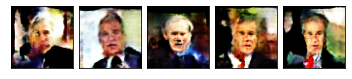

--- EPOCH 31/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.46it/s]
Discriminator loss: -1.9336742005258236
Generator loss:     0.8838700078568369


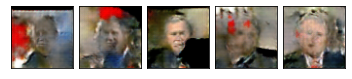

--- EPOCH 32/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.38it/s]
Discriminator loss: -1.938333270684728
Generator loss:     0.8859082094903262


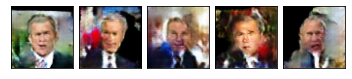

--- EPOCH 33/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:23<00:00,  2.26it/s]
Discriminator loss: -1.9542349689411667
Generator loss:     0.8899181372714493


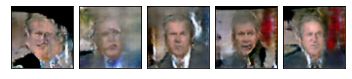

--- EPOCH 34/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.34it/s]
Discriminator loss: -1.9680307496268794
Generator loss:     0.8974061225945095


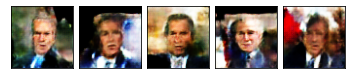

--- EPOCH 35/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.39it/s]
Discriminator loss: -1.9572954380287315
Generator loss:     0.9046406284818109


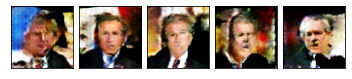

--- EPOCH 36/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.35it/s]
Discriminator loss: -2.0010129933087333
Generator loss:     0.9011817664470313


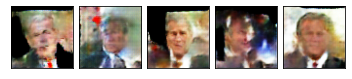

--- EPOCH 37/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.34it/s]
Discriminator loss: -1.9939041340126182
Generator loss:     0.9044779033031104


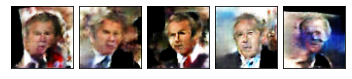

--- EPOCH 38/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:23<00:00,  2.30it/s]
Discriminator loss: -2.00704743502275
Generator loss:     0.914123701037101


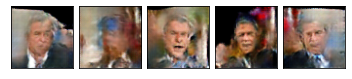

--- EPOCH 39/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:23<00:00,  2.23it/s]
Discriminator loss: -2.0012060538777767
Generator loss:     0.9099991001048178


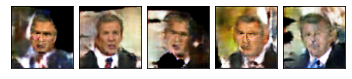

--- EPOCH 40/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.42it/s]
Discriminator loss: -2.034163902390678
Generator loss:     0.9221924509642259


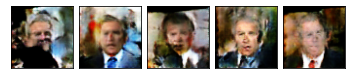

--- EPOCH 41/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:23<00:00,  2.29it/s]
Discriminator loss: -2.0347225621061504
Generator loss:     0.9259723334942224


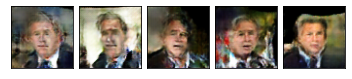

--- EPOCH 42/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.42it/s]
Discriminator loss: -2.0394257082129426
Generator loss:     0.9214541805240343


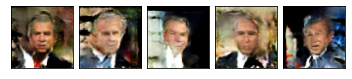

--- EPOCH 43/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.48it/s]
Discriminator loss: -2.0478501769731627
Generator loss:     0.9366388095999664


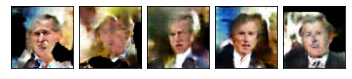

--- EPOCH 44/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.42it/s]
Discriminator loss: -2.048304811963495
Generator loss:     0.9337707116918744


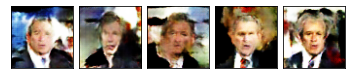

--- EPOCH 45/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.41it/s]
Discriminator loss: -2.0564523845348717
Generator loss:     0.9319739600397506


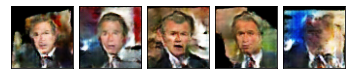

--- EPOCH 46/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.42it/s]
Discriminator loss: -2.061965413813321
Generator loss:     0.9192129975219943


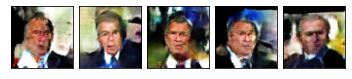

--- EPOCH 47/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.43it/s]
Discriminator loss: -2.0864849472945592
Generator loss:     0.9455541394791513


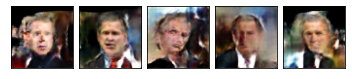

--- EPOCH 48/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.43it/s]
Discriminator loss: -2.083202944611603
Generator loss:     0.9387206378972756


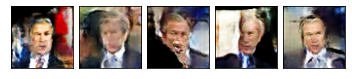

--- EPOCH 49/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.43it/s]
Discriminator loss: -2.0796229209540025
Generator loss:     0.9554249298460079


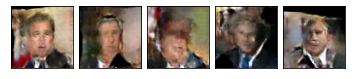

--- EPOCH 50/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.41it/s]
Discriminator loss: -2.110388897499948
Generator loss:     0.9674457873938218


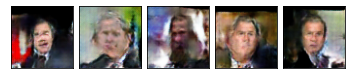

--- EPOCH 51/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.43it/s]
Discriminator loss: -2.1089627652798058
Generator loss:     0.9469818090492824


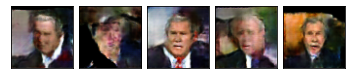

--- EPOCH 52/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.48it/s]
Discriminator loss: -2.1307209302794257
Generator loss:     0.9438822657432197


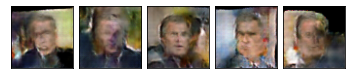

--- EPOCH 53/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.43it/s]
Discriminator loss: -2.124110572742966
Generator loss:     0.9548465137211781


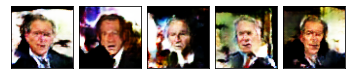

--- EPOCH 54/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.42it/s]
Discriminator loss: -2.137280374203088
Generator loss:     0.9646392936976451


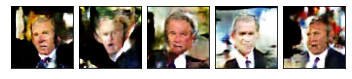

--- EPOCH 55/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.48it/s]
Discriminator loss: -2.1300164506120502
Generator loss:     0.9643198937739966


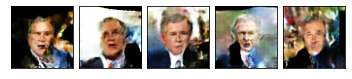

--- EPOCH 56/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.41it/s]
Discriminator loss: -2.131380027195193
Generator loss:     0.9704934707227743


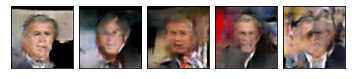

--- EPOCH 57/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:25<00:00,  2.06it/s]
Discriminator loss: -2.161123761590922
Generator loss:     0.9715516522245587


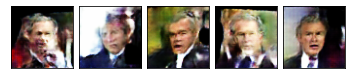

--- EPOCH 58/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:24<00:00,  2.18it/s]
Discriminator loss: -2.1415878579301655
Generator loss:     0.9771253320406068


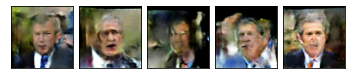

--- EPOCH 59/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:23<00:00,  2.25it/s]
Discriminator loss: -2.1893365765517614
Generator loss:     0.9882600633603222


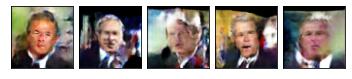

--- EPOCH 60/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.41it/s]
Discriminator loss: -2.1771209419898265
Generator loss:     0.976028617822899


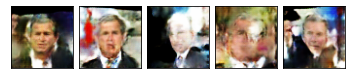

--- EPOCH 61/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.41it/s]
Discriminator loss: -2.182875300353428
Generator loss:     0.9717382518750317


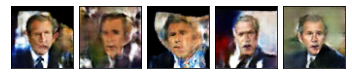

--- EPOCH 62/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.36it/s]
Discriminator loss: -2.173656978697147
Generator loss:     0.9792821733456738


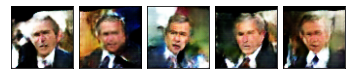

--- EPOCH 63/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:23<00:00,  2.29it/s]
Discriminator loss: -2.1922228471288143
Generator loss:     0.9813169820128747


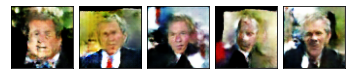

--- EPOCH 64/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.31it/s]
Discriminator loss: -2.184607593518383
Generator loss:     0.9846084399043389


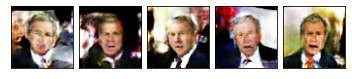

--- EPOCH 65/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.36it/s]
Discriminator loss: -2.2083810545363516
Generator loss:     1.013835035405069


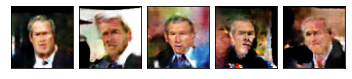

--- EPOCH 66/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.39it/s]
Discriminator loss: -2.200721324614759
Generator loss:     0.9899024687848001


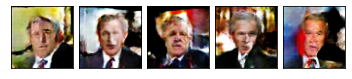

--- EPOCH 67/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.37it/s]
Discriminator loss: -2.225778044394727
Generator loss:     0.9998684413028214


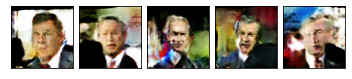

--- EPOCH 68/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.46it/s]
Discriminator loss: -2.2055208503075368
Generator loss:     0.9828659380381962


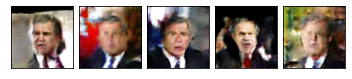

--- EPOCH 69/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.43it/s]
Discriminator loss: -2.2256159467517205
Generator loss:     1.013367457209893


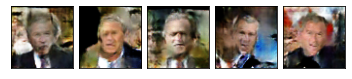

--- EPOCH 70/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.42it/s]
Discriminator loss: -2.2217343753238894
Generator loss:     1.0226239921911708


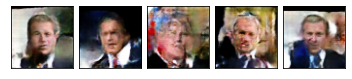

--- EPOCH 71/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.40it/s]
Discriminator loss: -2.23876916012674
Generator loss:     1.0066274100879453


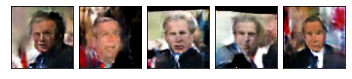

--- EPOCH 72/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.34it/s]
Discriminator loss: -2.2307569845667423
Generator loss:     1.012705701702046


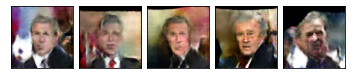

--- EPOCH 73/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.31it/s]
Discriminator loss: -2.235290043758896
Generator loss:     1.005279464541741


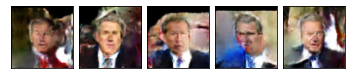

--- EPOCH 74/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.38it/s]
Discriminator loss: -2.239794263299906
Generator loss:     1.0106130051163007


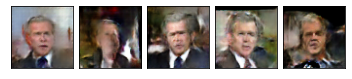

--- EPOCH 75/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:23<00:00,  2.26it/s]
Discriminator loss: -2.239011175227615
Generator loss:     1.0040784585026075


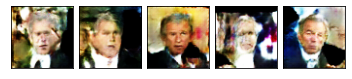

--- EPOCH 76/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.32it/s]
Discriminator loss: -2.245861770971766
Generator loss:     1.0070761498415246


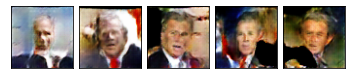

--- EPOCH 77/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.40it/s]
Discriminator loss: -2.2535729880602853
Generator loss:     1.0126635960812838


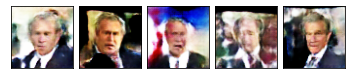

--- EPOCH 78/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.43it/s]
Discriminator loss: -2.2681617714324087
Generator loss:     1.0238156447995383


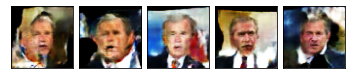

--- EPOCH 79/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.40it/s]
Discriminator loss: -2.2376447848553926
Generator loss:     1.0254315520232578


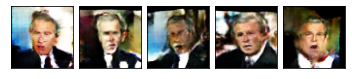

--- EPOCH 80/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.36it/s]
Discriminator loss: -2.26340950884909
Generator loss:     1.0292111792654361


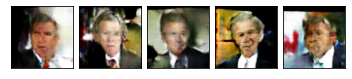

--- EPOCH 81/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.33it/s]
Discriminator loss: -2.2594679234162816
Generator loss:     1.0200654875557378


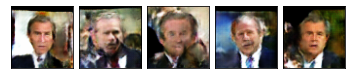

--- EPOCH 82/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.34it/s]
Discriminator loss: -2.292572358869157
Generator loss:     1.0372692998850122


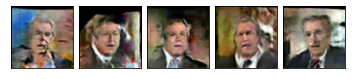

--- EPOCH 83/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.40it/s]
Discriminator loss: -2.2660288675776066
Generator loss:     1.030431112028518


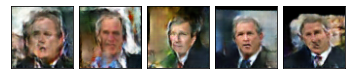

--- EPOCH 84/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.46it/s]
Discriminator loss: -2.2606351712964616
Generator loss:     1.0307631301430036


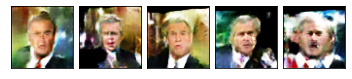

--- EPOCH 85/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.39it/s]
Discriminator loss: -2.2726522931512796
Generator loss:     1.0346230459663104


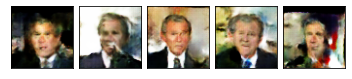

--- EPOCH 86/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.40it/s]
Discriminator loss: -2.2922967807301937
Generator loss:     1.0434371907756013


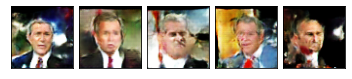

--- EPOCH 87/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.45it/s]
Discriminator loss: -2.267128105433482
Generator loss:     1.030679150572363


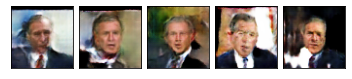

--- EPOCH 88/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.46it/s]
Discriminator loss: -2.2885171152510733
Generator loss:     1.0342429448973458


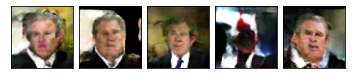

--- EPOCH 89/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.46it/s]
Discriminator loss: -2.2709786532060154
Generator loss:     1.0380015260768387


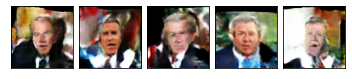

--- EPOCH 90/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.40it/s]
Discriminator loss: -2.2980398187097513
Generator loss:     1.0425665232370485


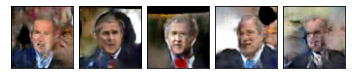

--- EPOCH 91/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.43it/s]
Discriminator loss: -2.2969412578726716
Generator loss:     1.0437391456568017


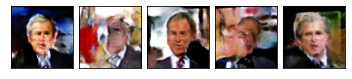

--- EPOCH 92/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.37it/s]
Discriminator loss: -2.3098101975782863
Generator loss:     1.050639549516282


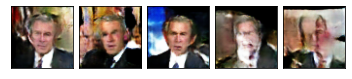

--- EPOCH 93/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.43it/s]
Discriminator loss: -2.3072745889987587
Generator loss:     1.0358209981108613


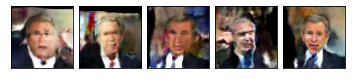

--- EPOCH 94/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.38it/s]
Discriminator loss: -2.2978394054016977
Generator loss:     1.0399513379582819


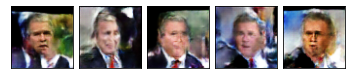

--- EPOCH 95/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.39it/s]
Discriminator loss: -2.2931161534111455
Generator loss:     1.0388530301597882


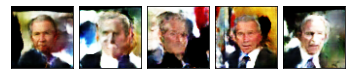

--- EPOCH 96/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.43it/s]
Discriminator loss: -2.3077689229317433
Generator loss:     1.031577947567094


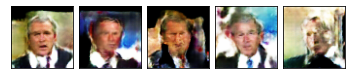

--- EPOCH 97/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.43it/s]
Discriminator loss: -2.3130695122592853
Generator loss:     1.042526290664133


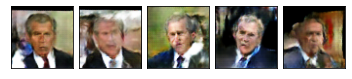

--- EPOCH 98/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.46it/s]
Discriminator loss: -2.3075782757885053
Generator loss:     1.0418910148008815


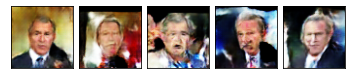

--- EPOCH 99/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:22<00:00,  2.41it/s]
Discriminator loss: -2.32470348646056
Generator loss:     1.0288342214980215


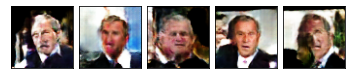

--- EPOCH 100/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:21<00:00,  2.42it/s]
Discriminator loss: -2.3148969029480555
Generator loss:     1.0506970128923092


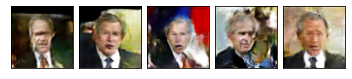

In [8]:
num_epochs = 100
fid_scores = []
if os.path.isfile(f'{checkpoint_file_final}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final

try:
    dsc_avg_losses, gen_avg_losses = [], []
    for epoch_idx in range(num_epochs):
        # We'll accumulate batch losses and show an average once per epoch.
        dsc_losses, gen_losses = [], []
        print(f'--- EPOCH {epoch_idx+1}/{num_epochs} ---')

        with tqdm.tqdm(total=len(dl_train.batch_sampler), file=sys.stdout) as pbar:
            for batch_idx, (x_data, _) in enumerate(dl_train):
                save_fid_score(fid_scores,batch_idx,gen,x_data)
                x_data = x_data.to(device)
                dsc_loss, gen_loss = train_wgan_batch(
                    dsc, gen,
                    dsc_loss_fn, gen_loss_fn,
                    dsc_optimizer, gen_optimizer,critic_iterations,
                    clip_value,x_data)
                dsc_losses.append(dsc_loss)
                gen_losses.append(gen_loss)
                pbar.update()

        dsc_avg_losses.append(np.mean(dsc_losses))
        gen_avg_losses.append(np.mean(gen_losses))
        print(f'Discriminator loss: {dsc_avg_losses[-1]}')
        print(f'Generator loss:     {gen_avg_losses[-1]}')
        
        if save_checkpoint(gen, dsc_avg_losses, gen_avg_losses, checkpoint_file):
            print(f'Saved checkpoint.')
            

        samples = gen.sample(5, with_grad=False)
        fig, _ = plot.tensors_as_images(samples.cpu(), figsize=(6,2))
        IPython.display.display(fig)
        
        if (epoch_idx % 3 == 0):
            image_path = os.path.join("W-GAN-Images",str(epoch_idx))
            image_path = create_picture_path(image_path)
            
            plt.savefig(image_path)
        
        plt.close(fig)

        
        
except KeyboardInterrupt as e:
    print('\n *** Training interrupted by user')

PLOT

[352.22491566048825, 335.69776585599016, 390.8757245127067, 425.07981211827746, 396.33138676152726, 436.5388629587915, 426.2945296296485, 385.4453450171188, 331.9174444456024, 338.2838847385438, 292.4271247884235, 349.24356405223426, 314.35439189330015, 347.1328976205369, 294.96484945903046, 291.8370896717404, 280.2673842591945, 286.89036764020494, 262.6320712285323, 292.11791617007225, 308.5491174332194, 266.68596718564703, 299.02088579603804, 238.93900635256884, 283.26638844957324, 253.21801866015358, 220.28202782096122, 269.39328509994687, 200.01306960002188, 240.2309656132511, 225.65910186743645, 240.6028462186946, 262.9784631558721, 288.3177711940876, 213.70793214316149, 215.00619812823746, 232.0699356234211, 256.5498303460255, 232.1901217069825, 227.79303986447206, 213.87036961739875, 219.41389546667546, 212.1000199397937, 256.7922751027907, 255.38244725360292, 257.4565115597917, 192.10071181142877, 282.349867637956, 224.63386819303275, 179.76932860837132, 188.47717525157418, 193

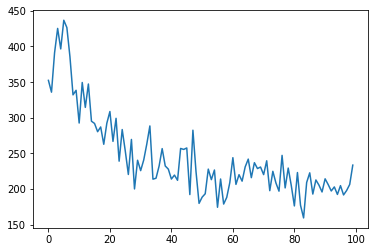

In [9]:
print(fid_scores)

plot = plt.plot(fid_scores)
plt.savefig("WNGAN_fid.png")
plt.close(fig)
